In [1]:
# EDA for fish image classification project

# The dataset was sourced from kaggle.com; citation is denoted below
#   title={A Large-Scale Dataset for Fish Segmentation and Classification},
#   author={Ulucan, Oguzhan and Karakaya, Diclehan and Turkan, Mehmet},
#   booktitle={2020 Innovations in Intelligent Systems and Applications Conference (ASYU)},
#   pages={1--5},
#   year={2020},
#   organization={IEEE}

# Importing the required libraries/packages
import numpy as np
import datetime as datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as image
import random
import os
import glob
import cv2
import pathlib 
import tensorflow as tf

# reading in the datasets and splitting into "Ground Truth" and targeted "Training Data"

abs_path = '/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/3rdCapRepo/data/Fish Dataset Project/Fish_Dataset'

# defining the absolute path; for the relative path use ('.')
data_path = pathlib.Path(abs_path)

# confirming the directory path
data_path.is_dir()

True

In [2]:
# returning a list of all sub folder names within the directory; these will be the label names
labels = [os.path.basename(x) for x in glob.glob(abs_path + '/*', recursive=True)]

# alternatively, could use os.listdir(abs_path), but that also returns a jupyter notebook checkpoint 
labels

['Sea Bass',
 'Red Mullet',
 'Gilt-Head Bream',
 'Red Sea Bream',
 'Shrimp',
 'Black Sea Sprat',
 'Striped Red Mullet',
 'Hourse Mackerel',
 'Trout']

In [3]:
# using the labels to gain access to the pictures via pathway construction (example is below)
# '/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/
#  3rdCapRepo/data/Fish Dataset Project/Fish_Dataset/Sea Bass/Sea Bass
#  need to duplicate each label and then extract the list of images to create a dataframe with the label
#  and a list of all images

images_pathway = [abs_path + (2 *('/' + fishname)) + '/' for fishname in labels]
seabass_images_list = sorted(os.listdir(images_pathway[0]))

# example of a list of images within the Sea Bass directory
print(images_pathway[0], seabass_images_list[0:5])

/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/3rdCapRepo/data/Fish Dataset Project/Fish_Dataset/Sea Bass/Sea Bass/ ['00001.png', '00002.png', '00003.png', '00004.png', '00005.png']


In [4]:
# putting the above cell together and constructing a dataframe with labels and their associated images 
# could've done a nested for loop instead, but list comprehension is much faster
images_list = [abs_path + (2 *('/' + fishname)) + '/' + i for fishname in labels 
               for i in sorted(os.listdir(abs_path + (2 *('/' + fishname))))]

image_df = pd.DataFrame(images_list).rename(columns = {0:'Image_Pathway'})
image_df['Label'] = [pathway.split("/")[-2] for pathway in image_df.Image_Pathway]
image_df.head(5)

,Image_Pathway,Label
0,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
1,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
2,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
3,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
4,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass


In [5]:
# looks good to me
image_df.describe()

,Image_Pathway,Label
count,9000,9000
unique,9000,9
top,/Users/alexanderblaies/Desktop/SpringboardAssi...,Shrimp
freq,1,1000


In [6]:
# double checking to ensure that the labels were properly applied
image_df.Label.value_counts()

Shrimp                1000
Gilt-Head Bream       1000
Red Sea Bream         1000
Hourse Mackerel       1000
Black Sea Sprat       1000
Red Mullet            1000
Striped Red Mullet    1000
Trout                 1000
Sea Bass              1000
Name: Label, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

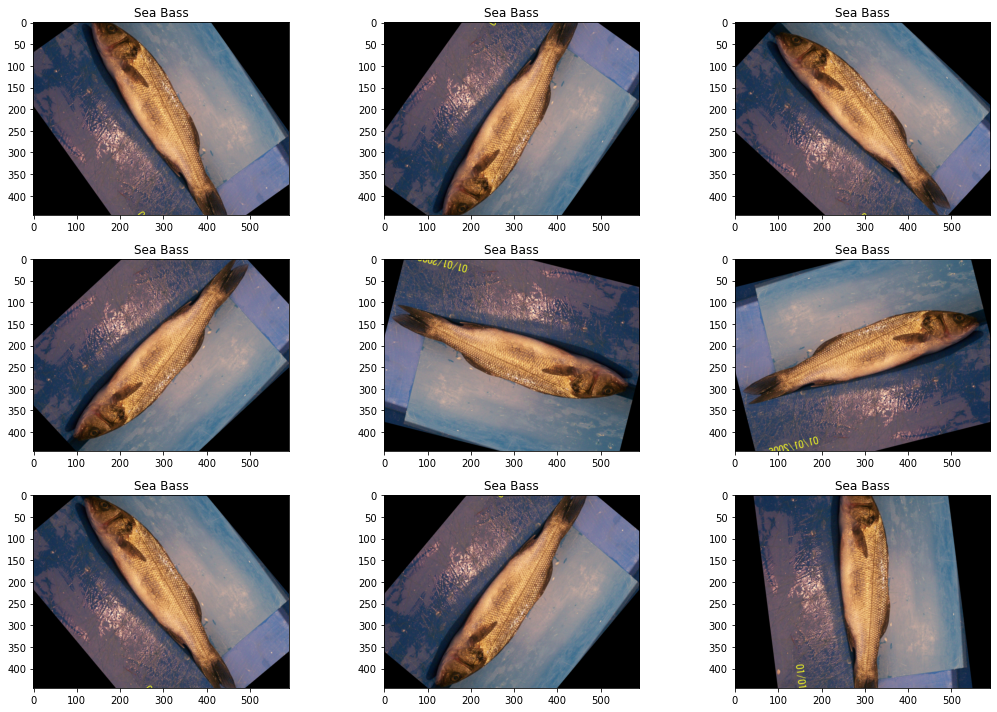

In [7]:
# now it's time to go ahead and sample the Sea Bass Images to better understand what type of contexts are included
# hence, are we accounting for a change in lighting, orientation, cropping, background imaging, etc?
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,10))

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Image_Pathway[i]))
    ax.set_title(image_df.Label[i])

plt.tight_layout()
plt.show

# it looks like we are accounting for a few different perspectives here; because the images are relatively clean, 
# we may not be accounting for a lot of variability; so, this should be relatively straightforward

<function matplotlib.pyplot.show(close=None, block=None)>

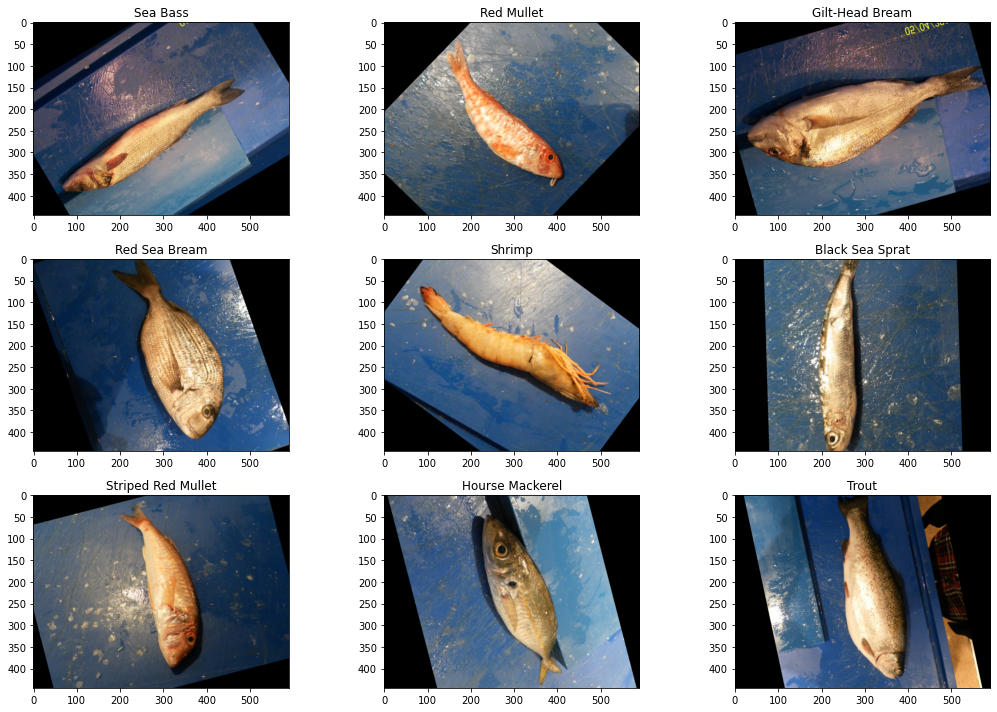

In [8]:
# now, let's look at one of each type of fish 
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,10))

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Image_Pathway[(i + 1) * 999]))
    ax.set_title(image_df.Label[(i + 1) * 999])

plt.tight_layout()
plt.show

DataPrep Report
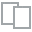
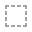
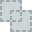
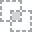
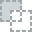
...
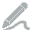
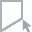
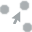
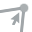
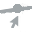

In [9]:
# found this online.. pretty neat summary of the data without having to code 
from dataprep.eda import create_report
create_report(image_df)

In [10]:
# there's no much eda to be had aside from maybe analyzing the color context, so I'll do that
# and then let's jump right into the modelling


In [11]:
# creating a train and testing split
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(image_df, train_size = 0.8, shuffle = True, random_state = 49)
print(train_df.shape, test_df.shape)

(7200, 2) (1800, 2)


In [12]:
# time to load the images and utilize the ImageDataGenerator

from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(validation_split = 0.25)
test_generator = ImageDataGenerator()


In [13]:
# creating a training set, validation of the training set and test set for evaluation

training_images = train_generator.flow_from_dataframe(dataframe = train_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = True
                 , seed = 45, subset = "training")

train_val_images = train_generator.flow_from_dataframe(dataframe = train_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = True
                 , seed = 45, subset = "validation")

test_images = train_generator.flow_from_dataframe(dataframe = test_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = True
                 , seed = 45)


Found 5400 validated image filenames belonging to 9 classes.
Found 1800 validated image filenames belonging to 9 classes.
Found 1800 validated image filenames belonging to 9 classes.


In [14]:
# initializing the modelling 

from tensorflow.keras import layers,models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.applications import mobilenet_v2

model = Sequential()
model.add(Conv2D(64, (3,3), activation = "relu", input_shape = (256, 256, 3)))
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(128, (3,3), activation = "relu"))
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(256, (3,3), activation = "relu"))
model.add(MaxPooling2D((2,2)))

model.add(Flatten())

model.add(Dense(128, activation = "relu"))
model.add(Dropout(0.3))

model.add(Dense(128, activation = "relu"))
model.add(Dropout(0.3))

model.add(Dense(9, activation = "softmax"))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 128)     73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 256)       295168    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 30, 30, 256)       0         
_________________________________________________________________
flatten (Flatten)            (None, 230400)            0

In [15]:
# training the model 
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["accuracy"])

check = ModelCheckpoint("Best Model.h5", monitor = 'val_accuracy')
early_stop = EarlyStopping(patience = 15, restore_best_weights = True, monitor = "loss", mode = "min")

history = model.fit(training_images, steps_per_epoch = 20, epochs = 25
                      , validation_data = train_val_images, validation_steps = 50, validation_freq = list(range(26))
                      , callbacks = [check, early_stop])


Epoch 1/25
20/20 [==============================] - ETA: 0s - loss: 47.6829 - accuracy: 0.1480WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 50 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 217s 11s/step - loss: 47.6829 - accuracy: 0.1480 - val_loss: 2.0827 - val_accuracy: 0.2806
Epoch 2/25
20/20 [==============================] - 153s 7s/step - loss: 2.0117 - accuracy: 0.2580


Can save best model only with val_accuracy available, skipping.


Epoch 3/25
20/20 [==============================] - 144s 7s/step - loss: 1.8082 - accuracy: 0.3240


Can save best model only with val_accuracy available, skipping.


Epoch 4/25
20/20 [==============================] - 139s 7s/step - loss: 1.7270 - accuracy: 0.3740


Can save best model only with val_accuracy available, skipping.


Epoch 5/25
20/20 [==============================] - 139s 7s/step - loss: 1.5426 - accuracy: 0.4380


Can save best model only with val_accuracy available, skipping.


Epoch 6/25
20/20 [==============================] - 140s 7s/step - loss: 1.3354 - accuracy: 0.5180


Can save best model only with val_accuracy available, skipping.


Epoch 7/25
20/20 [==============================] - 139s 7s/step - loss: 1.2877 - accuracy: 0.5570


Can save best model only with val_accuracy available, skipping.


Epoch 8/25
20/20 [==============================] - 138s 7s/step - loss: 1.0697 - accuracy: 0.6120


Can save best model only with val_accuracy available, skipping.


Epoch 9/25
20/20 [==============================] - 138s 7s/step - loss: 0.9228 - accuracy: 0.6790


Can save best model only with val_accuracy available, skipping.


Epoch 10/25
20/20 [==============================] - 141s 7s/step - loss: 0.7532 - accuracy: 0.7360


Can save best model only with val_accuracy available, skipping.


Epoch 11/25
20/20 [==============================] - 143s 7s/step - loss: 0.6763 - accuracy: 0.7650


Can save best model only with val_accuracy available, skipping.


Epoch 12/25
20/20 [==============================] - 142s 7s/step - loss: 0.6850 - accuracy: 0.7660


Can save best model only with val_accuracy available, skipping.


Epoch 13/25
20/20 [==============================] - 137s 7s/step - loss: 0.5493 - accuracy: 0.8030


Can save best model only with val_accuracy available, skipping.


Epoch 14/25
20/20 [==============================] - 139s 7s/step - loss: 0.5287 - accuracy: 0.8270


Can save best model only with val_accuracy available, skipping.


Epoch 15/25
20/20 [==============================] - 141s 7s/step - loss: 0.9958 - accuracy: 0.8120


Can save best model only with val_accuracy available, skipping.


Epoch 16/25
20/20 [==============================] - 143s 7s/step - loss: 0.6864 - accuracy: 0.7990


Can save best model only with val_accuracy available, skipping.


Epoch 17/25
20/20 [==============================] - 139s 7s/step - loss: 0.4822 - accuracy: 0.8440


Can save best model only with val_accuracy available, skipping.


Epoch 18/25
20/20 [==============================] - 140s 7s/step - loss: 0.4611 - accuracy: 0.8620


Can save best model only with val_accuracy available, skipping.


Epoch 19/25
20/20 [==============================] - 141s 7s/step - loss: 0.3833 - accuracy: 0.8800


Can save best model only with val_accuracy available, skipping.


Epoch 20/25
20/20 [==============================] - 143s 7s/step - loss: 0.3098 - accuracy: 0.8990


Can save best model only with val_accuracy available, skipping.


Epoch 21/25
20/20 [==============================] - 139s 7s/step - loss: 0.3595 - accuracy: 0.8910


Can save best model only with val_accuracy available, skipping.


Epoch 22/25
20/20 [==============================] - 143s 7s/step - loss: 0.2901 - accuracy: 0.9210


Can save best model only with val_accuracy available, skipping.


Epoch 23/25
20/20 [==============================] - 144s 7s/step - loss: 0.2883 - accuracy: 0.9010


Can save best model only with val_accuracy available, skipping.


Epoch 24/25
20/20 [==============================] - 143s 7s/step - loss: 0.2286 - accuracy: 0.9270


Can save best model only with val_accuracy available, skipping.


Epoch 25/25
20/20 [==============================] - 144s 7s/step - loss: 0.2326 - accuracy: 0.9270


Can save best model only with val_accuracy available, skipping.


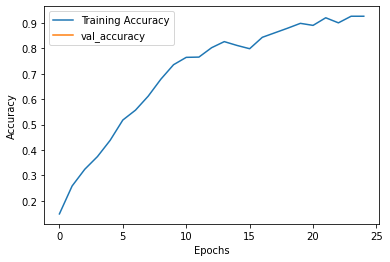

In [18]:
# plotting the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [23]:
# applying the trained model and making predictions
loss, accuracy , precision, recall =model.evaluate(test_imgs)
print('Test Accuracy: %.3f' % accuracy)
print('Test Precision: %.3f' % precision)
print('Test Recall: %.3f' % recall)
print('Test loss: %.3f' % loss)

[2 0 3 ... 7 2 3]
{0: 'Black Sea Sprat', 1: 'Gilt-Head Bream', 2: 'Hourse Mackerel', 3: 'Red Mullet', 4: 'Red Sea Bream', 5: 'Sea Bass', 6: 'Shrimp', 7: 'Striped Red Mullet', 8: 'Trout'}


In [28]:
# my code is definitely wrong here.. need to troubleshoot 
from sklearn.metrics import classification_report

y_prediction = [labels_[k] for k in prediction]
print(classification_report(test_df.Label, y_prediction))

                    precision    recall  f1-score   support

   Black Sea Sprat       0.08      0.08      0.08       207
   Gilt-Head Bream       0.14      0.15      0.15       205
   Hourse Mackerel       0.17      0.17      0.17       224
        Red Mullet       0.12      0.11      0.12       202
     Red Sea Bream       0.07      0.07      0.07       185
          Sea Bass       0.10      0.10      0.10       191
            Shrimp       0.09      0.09      0.09       185
Striped Red Mullet       0.09      0.09      0.09       208
             Trout       0.13      0.13      0.13       193

          accuracy                           0.11      1800
         macro avg       0.11      0.11      0.11      1800
      weighted avg       0.11      0.11      0.11      1800



In [25]:
result = model.evaluate(test_images)
print(f"Loss in test dataset: {result[0]}")
print(f"Accuracy in test dataset: {result[1] * 100}%")

36/36 [==============================] - 76s 2s/step - loss: 0.1152 - accuracy: 0.9628
Loss in test dataset: 0.11522650718688965
Accuracy in test dataset: 96.27777934074402%
